# CLONE THE DRIVE

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [82]:
import os

DATA_DIR = '/content/drive/MyDrive/g'
print(os.listdir(DATA_DIR))

['birds']


In [83]:
print(os.listdir(DATA_DIR+'/birds')[:10])

['8959.jpg', '161.jpg', '115.jpg', '8980.jpg', '381.jpg', '9030.jpg', '63601.jpg', '63536.jpg', '437.jpg', '63524.jpg']


Let's load this dataset using the `ImageFolder` class from `torchvision`. We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range `(-1, 1)`, which is more  convenient for training the discriminator. We will also create a data loader to load the data in batches.

In [84]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [85]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [86]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

Let's create helper functions to denormalize the image tensors and display some sample images from a training batch.

In [87]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [88]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [89]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

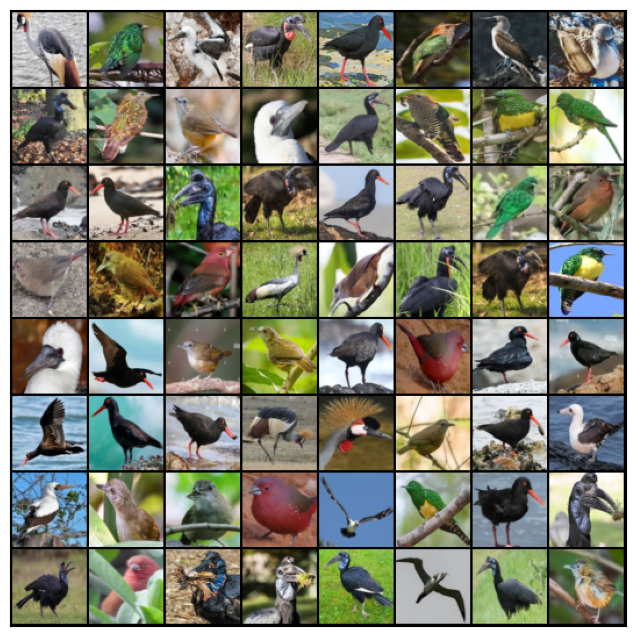

In [90]:
show_batch(train_dl)

## Using a GPU

To seamlessly use a GPU, if one is available, we define a couple of helper functions (`get_default_device` & `to_device`) and a helper class `DeviceDataLoader` to move our model & data to the GPU, if one is available.

In [91]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Based on where you're running this notebook, your default device could be a CPU (`torch.device('cpu')`) or a GPU (`torch.device('cuda')`).

In [92]:
device = get_default_device()
device

device(type='cuda')

We can now move our training data loader using `DeviceDataLoader` for automatically transferring batches of data to the GPU (if available).

In [93]:
train_dl = DeviceDataLoader(train_dl, device)

In [94]:
import torch.nn as nn

# DISCRIMINATOR NETWORK

In [95]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [96]:
discriminator = to_device(discriminator, device)

In [97]:
latent_size = 600

# GENERATOR NETWORK

In [98]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


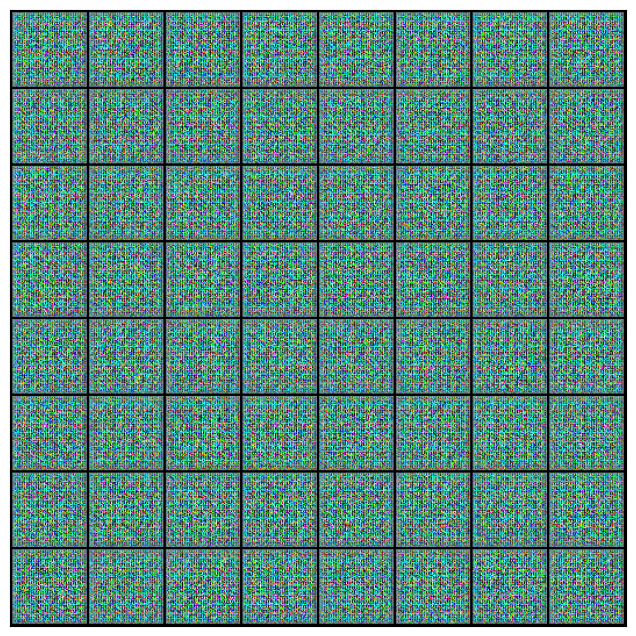

In [99]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

As one might expect, the output from the generator is basically random noise, since we haven't trained it yet. 

Let's move the generator to the chosen device.

In [100]:
generator = to_device(generator, device)

# TRAINING OF DISCRIMINATOR

In [101]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

# TRAINING GENERATOR

In [102]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    
    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)
    
    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)
    
    # Update generator weights
    loss.backward()
    opt_g.step()
    
    return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [103]:
from torchvision.utils import save_image

In [104]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [105]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [106]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


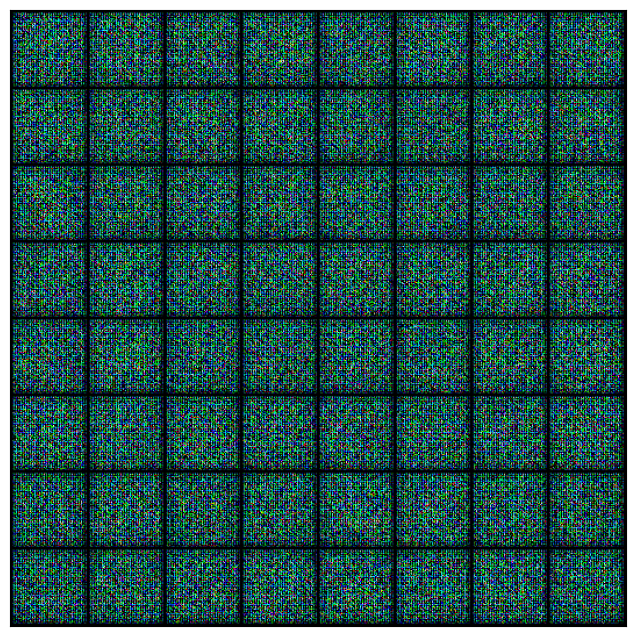

In [107]:
save_samples(0, fixed_latent)

In [108]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [109]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    
    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []
    
    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
    
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)
            
        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)
        
        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))
    
        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)
    
    return losses_g, losses_d, real_scores, fake_scores

We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator.

In [110]:
lr = 0.0001
epochs = 600

# TRAINING

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [1/800], loss_g: 3.0931, loss_d: 0.8755, real_score: 0.6590, fake_score: 0.3250
Saving generated-images-0001.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [2/800], loss_g: 5.1522, loss_d: 0.5659, real_score: 0.7555, fake_score: 0.2210
Saving generated-images-0002.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [3/800], loss_g: 6.4546, loss_d: 0.4021, real_score: 0.8098, fake_score: 0.1638
Saving generated-images-0003.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [4/800], loss_g: 7.6661, loss_d: 0.3884, real_score: 0.8595, fake_score: 0.1976
Saving generated-images-0004.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [5/800], loss_g: 7.6710, loss_d: 0.2329, real_score: 0.9119, fake_score: 0.1272
Saving generated-images-0005.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [6/800], loss_g: 7.2656, loss_d: 0.1773, real_score: 0.9164, fake_score: 0.0811
Saving generated-images-0006.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [7/800], loss_g: 7.2088, loss_d: 0.0731, real_score: 0.9634, fake_score: 0.0347
Saving generated-images-0007.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [8/800], loss_g: 7.3399, loss_d: 0.0736, real_score: 0.9632, fake_score: 0.0341
Saving generated-images-0008.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [9/800], loss_g: 7.8070, loss_d: 0.0839, real_score: 0.9539, fake_score: 0.0325
Saving generated-images-0009.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [10/800], loss_g: 7.4854, loss_d: 0.0503, real_score: 0.9715, fake_score: 0.0208
Saving generated-images-0010.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [11/800], loss_g: 7.1732, loss_d: 0.0582, real_score: 0.9637, fake_score: 0.0199
Saving generated-images-0011.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [12/800], loss_g: 7.7906, loss_d: 0.0223, real_score: 0.9869, fake_score: 0.0089
Saving generated-images-0012.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [13/800], loss_g: 8.0278, loss_d: 0.0436, real_score: 0.9829, fake_score: 0.0257
Saving generated-images-0013.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [14/800], loss_g: 7.9245, loss_d: 0.0360, real_score: 0.9815, fake_score: 0.0170
Saving generated-images-0014.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [15/800], loss_g: 9.0493, loss_d: 0.0492, real_score: 0.9850, fake_score: 0.0332
Saving generated-images-0015.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [16/800], loss_g: 14.1352, loss_d: 0.0483, real_score: 0.9541, fake_score: 0.0000
Saving generated-images-0016.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [17/800], loss_g: 7.1090, loss_d: 0.0140, real_score: 0.9870, fake_score: 0.0008
Saving generated-images-0017.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [18/800], loss_g: 7.1227, loss_d: 0.0268, real_score: 0.9892, fake_score: 0.0157
Saving generated-images-0018.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [19/800], loss_g: 7.9462, loss_d: 0.0305, real_score: 0.9872, fake_score: 0.0172
Saving generated-images-0019.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [20/800], loss_g: 7.6496, loss_d: 0.0269, real_score: 0.9897, fake_score: 0.0163
Saving generated-images-0020.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [21/800], loss_g: 7.2273, loss_d: 0.0348, real_score: 0.9782, fake_score: 0.0120
Saving generated-images-0021.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [22/800], loss_g: 7.8233, loss_d: 0.0229, real_score: 0.9899, fake_score: 0.0125
Saving generated-images-0022.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [23/800], loss_g: 7.6728, loss_d: 0.0130, real_score: 0.9961, fake_score: 0.0091
Saving generated-images-0023.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [24/800], loss_g: 7.1190, loss_d: 0.0246, real_score: 0.9842, fake_score: 0.0080
Saving generated-images-0024.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [25/800], loss_g: 7.4806, loss_d: 0.0132, real_score: 0.9951, fake_score: 0.0082
Saving generated-images-0025.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [26/800], loss_g: 7.9835, loss_d: 0.0200, real_score: 0.9902, fake_score: 0.0100
Saving generated-images-0026.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [27/800], loss_g: 8.8830, loss_d: 0.0296, real_score: 0.9851, fake_score: 0.0143
Saving generated-images-0027.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [28/800], loss_g: 8.6798, loss_d: 0.0066, real_score: 0.9984, fake_score: 0.0050
Saving generated-images-0028.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [29/800], loss_g: 7.2058, loss_d: 0.0181, real_score: 0.9880, fake_score: 0.0055
Saving generated-images-0029.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [30/800], loss_g: 6.5951, loss_d: 0.0117, real_score: 0.9933, fake_score: 0.0049
Saving generated-images-0030.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [31/800], loss_g: 6.2719, loss_d: 0.0152, real_score: 0.9879, fake_score: 0.0025
Saving generated-images-0031.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [32/800], loss_g: 6.5761, loss_d: 0.0098, real_score: 0.9950, fake_score: 0.0048
Saving generated-images-0032.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [33/800], loss_g: 5.8125, loss_d: 0.0274, real_score: 0.9804, fake_score: 0.0063
Saving generated-images-0033.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [34/800], loss_g: 14.9816, loss_d: 0.1108, real_score: 0.9958, fake_score: 0.0956
Saving generated-images-0034.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [35/800], loss_g: 6.2770, loss_d: 0.0109, real_score: 0.9961, fake_score: 0.0068
Saving generated-images-0035.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [36/800], loss_g: 5.4317, loss_d: 0.4167, real_score: 0.9329, fake_score: 0.1177
Saving generated-images-0036.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [37/800], loss_g: 7.6864, loss_d: 0.2003, real_score: 0.9231, fake_score: 0.0923
Saving generated-images-0037.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [38/800], loss_g: 7.3636, loss_d: 0.0463, real_score: 0.9673, fake_score: 0.0086
Saving generated-images-0038.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [39/800], loss_g: 11.0461, loss_d: 0.1653, real_score: 0.9790, fake_score: 0.1271
Saving generated-images-0039.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [40/800], loss_g: 5.5653, loss_d: 0.0865, real_score: 0.9368, fake_score: 0.0068
Saving generated-images-0040.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [41/800], loss_g: 6.4988, loss_d: 0.0560, real_score: 0.9889, fake_score: 0.0431
Saving generated-images-0041.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [42/800], loss_g: 8.5221, loss_d: 0.0597, real_score: 0.9458, fake_score: 0.0020
Saving generated-images-0042.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [43/800], loss_g: 8.7303, loss_d: 0.0467, real_score: 0.9581, fake_score: 0.0022
Saving generated-images-0043.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [44/800], loss_g: 3.6381, loss_d: 0.3246, real_score: 0.9891, fake_score: 0.1835
Saving generated-images-0044.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [45/800], loss_g: 4.6482, loss_d: 0.0991, real_score: 0.9669, fake_score: 0.0613
Saving generated-images-0045.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [46/800], loss_g: 5.1907, loss_d: 0.1127, real_score: 0.9474, fake_score: 0.0520
Saving generated-images-0046.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [47/800], loss_g: 5.0938, loss_d: 0.1449, real_score: 0.8865, fake_score: 0.0072
Saving generated-images-0047.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [48/800], loss_g: 6.7122, loss_d: 0.0949, real_score: 0.9738, fake_score: 0.0632
Saving generated-images-0048.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [49/800], loss_g: 4.7653, loss_d: 0.1527, real_score: 0.9069, fake_score: 0.0160
Saving generated-images-0049.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [50/800], loss_g: 7.1149, loss_d: 0.1326, real_score: 0.9089, fake_score: 0.0011
Saving generated-images-0050.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [51/800], loss_g: 5.5932, loss_d: 0.1769, real_score: 0.9323, fake_score: 0.0843
Saving generated-images-0051.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [52/800], loss_g: 4.7095, loss_d: 0.1168, real_score: 0.9470, fake_score: 0.0557
Saving generated-images-0052.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [53/800], loss_g: 3.6878, loss_d: 0.2640, real_score: 0.8725, fake_score: 0.1014
Saving generated-images-0053.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [54/800], loss_g: 4.7204, loss_d: 0.1372, real_score: 0.9383, fake_score: 0.0648
Saving generated-images-0054.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [55/800], loss_g: 6.2357, loss_d: 0.1461, real_score: 0.9638, fake_score: 0.0974
Saving generated-images-0055.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [56/800], loss_g: 5.9197, loss_d: 0.1224, real_score: 0.9413, fake_score: 0.0522
Saving generated-images-0056.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [57/800], loss_g: 4.8826, loss_d: 0.0924, real_score: 0.9899, fake_score: 0.0743
Saving generated-images-0057.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [58/800], loss_g: 6.8294, loss_d: 0.2406, real_score: 0.9473, fake_score: 0.1591
Saving generated-images-0058.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [59/800], loss_g: 5.8247, loss_d: 0.0916, real_score: 0.9571, fake_score: 0.0382
Saving generated-images-0059.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [60/800], loss_g: 4.4419, loss_d: 0.5424, real_score: 0.9881, fake_score: 0.3505
Saving generated-images-0060.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [61/800], loss_g: 4.0736, loss_d: 0.1469, real_score: 0.9174, fake_score: 0.0469
Saving generated-images-0061.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [62/800], loss_g: 4.3183, loss_d: 0.1552, real_score: 0.9285, fake_score: 0.0698
Saving generated-images-0062.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [63/800], loss_g: 6.0146, loss_d: 0.1349, real_score: 0.9711, fake_score: 0.0957
Saving generated-images-0063.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [64/800], loss_g: 7.1380, loss_d: 0.1404, real_score: 0.8917, fake_score: 0.0041
Saving generated-images-0064.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [65/800], loss_g: 4.6805, loss_d: 0.0878, real_score: 0.9521, fake_score: 0.0346
Saving generated-images-0065.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [66/800], loss_g: 4.1961, loss_d: 2.2745, real_score: 0.2774, fake_score: 0.0002
Saving generated-images-0066.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [67/800], loss_g: 5.6782, loss_d: 0.2790, real_score: 0.9637, fake_score: 0.1927
Saving generated-images-0067.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [68/800], loss_g: 4.8572, loss_d: 0.1322, real_score: 0.9148, fake_score: 0.0286
Saving generated-images-0068.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [69/800], loss_g: 5.0877, loss_d: 0.1815, real_score: 0.9005, fake_score: 0.0604
Saving generated-images-0069.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [70/800], loss_g: 5.1742, loss_d: 0.1446, real_score: 0.8992, fake_score: 0.0261
Saving generated-images-0070.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [71/800], loss_g: 4.4458, loss_d: 0.0576, real_score: 0.9880, fake_score: 0.0418
Saving generated-images-0071.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [72/800], loss_g: 6.5713, loss_d: 0.1761, real_score: 0.9648, fake_score: 0.1225
Saving generated-images-0072.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [73/800], loss_g: 9.8111, loss_d: 0.1360, real_score: 0.9934, fake_score: 0.1167
Saving generated-images-0073.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [74/800], loss_g: 14.6055, loss_d: 0.4090, real_score: 0.9759, fake_score: 0.2867
Saving generated-images-0074.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [75/800], loss_g: 3.0566, loss_d: 0.2283, real_score: 0.8546, fake_score: 0.0248
Saving generated-images-0075.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [76/800], loss_g: 4.8337, loss_d: 0.3008, real_score: 0.8712, fake_score: 0.1273
Saving generated-images-0076.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [77/800], loss_g: 4.9898, loss_d: 0.1100, real_score: 0.9271, fake_score: 0.0260
Saving generated-images-0077.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [78/800], loss_g: 6.1246, loss_d: 0.2681, real_score: 0.9291, fake_score: 0.1577
Saving generated-images-0078.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [79/800], loss_g: 4.6798, loss_d: 0.1365, real_score: 0.9317, fake_score: 0.0579
Saving generated-images-0079.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [80/800], loss_g: 5.2973, loss_d: 0.1983, real_score: 0.9457, fake_score: 0.1063
Saving generated-images-0080.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [81/800], loss_g: 5.7993, loss_d: 0.2336, real_score: 0.9879, fake_score: 0.1714
Saving generated-images-0081.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [82/800], loss_g: 3.3479, loss_d: 0.5811, real_score: 0.6372, fake_score: 0.0022
Saving generated-images-0082.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [83/800], loss_g: 5.0382, loss_d: 0.7249, real_score: 0.9964, fake_score: 0.4075
Saving generated-images-0083.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [84/800], loss_g: 3.5285, loss_d: 0.1624, real_score: 0.8918, fake_score: 0.0340
Saving generated-images-0084.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [85/800], loss_g: 6.8770, loss_d: 0.4466, real_score: 0.9698, fake_score: 0.2710
Saving generated-images-0085.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [86/800], loss_g: 5.0836, loss_d: 0.2263, real_score: 0.8436, fake_score: 0.0257
Saving generated-images-0086.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [87/800], loss_g: 5.7053, loss_d: 0.1301, real_score: 0.9750, fake_score: 0.0857
Saving generated-images-0087.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [88/800], loss_g: 3.6198, loss_d: 0.3138, real_score: 0.8406, fake_score: 0.0901
Saving generated-images-0088.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [89/800], loss_g: 3.9863, loss_d: 0.0675, real_score: 0.9773, fake_score: 0.0407
Saving generated-images-0089.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [90/800], loss_g: 3.1500, loss_d: 0.3179, real_score: 0.8109, fake_score: 0.0719
Saving generated-images-0090.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [91/800], loss_g: 2.5647, loss_d: 2.3190, real_score: 0.1866, fake_score: 0.0006
Saving generated-images-0091.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [92/800], loss_g: 3.7869, loss_d: 0.1105, real_score: 0.9470, fake_score: 0.0514
Saving generated-images-0092.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [93/800], loss_g: 5.5419, loss_d: 0.3119, real_score: 0.8971, fake_score: 0.1674
Saving generated-images-0093.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [94/800], loss_g: 6.4321, loss_d: 0.1363, real_score: 0.8881, fake_score: 0.0046
Saving generated-images-0094.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [95/800], loss_g: 6.8426, loss_d: 0.6388, real_score: 0.6167, fake_score: 0.0009
Saving generated-images-0095.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [96/800], loss_g: 4.7399, loss_d: 0.2256, real_score: 0.9073, fake_score: 0.1109
Saving generated-images-0096.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [97/800], loss_g: 3.7479, loss_d: 0.2970, real_score: 0.8279, fake_score: 0.0841
Saving generated-images-0097.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [98/800], loss_g: 4.8949, loss_d: 0.2558, real_score: 0.8993, fake_score: 0.1234
Saving generated-images-0098.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [99/800], loss_g: 3.2604, loss_d: 0.2270, real_score: 0.8281, fake_score: 0.0231
Saving generated-images-0099.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [100/800], loss_g: 3.9421, loss_d: 0.1480, real_score: 0.9605, fake_score: 0.0964
Saving generated-images-0100.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [101/800], loss_g: 3.1908, loss_d: 0.2091, real_score: 0.9254, fake_score: 0.1150
Saving generated-images-0101.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [102/800], loss_g: 3.4487, loss_d: 0.1839, real_score: 0.8642, fake_score: 0.0242
Saving generated-images-0102.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [103/800], loss_g: 4.7897, loss_d: 0.2363, real_score: 0.9717, fake_score: 0.1725
Saving generated-images-0103.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [104/800], loss_g: 5.5074, loss_d: 0.3113, real_score: 0.9417, fake_score: 0.2032
Saving generated-images-0104.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [105/800], loss_g: 4.5926, loss_d: 0.2046, real_score: 0.9293, fake_score: 0.1136
Saving generated-images-0105.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [106/800], loss_g: 4.6565, loss_d: 0.2960, real_score: 0.9906, fake_score: 0.2180
Saving generated-images-0106.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [107/800], loss_g: 3.8086, loss_d: 0.2824, real_score: 0.8092, fake_score: 0.0314
Saving generated-images-0107.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [108/800], loss_g: 7.7192, loss_d: 0.4618, real_score: 0.9331, fake_score: 0.2918
Saving generated-images-0108.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [109/800], loss_g: 3.8336, loss_d: 0.3606, real_score: 0.8811, fake_score: 0.1794
Saving generated-images-0109.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [110/800], loss_g: 3.0969, loss_d: 0.2116, real_score: 0.8623, fake_score: 0.0510
Saving generated-images-0110.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [111/800], loss_g: 3.6719, loss_d: 0.1422, real_score: 0.9475, fake_score: 0.0809
Saving generated-images-0111.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [112/800], loss_g: 2.1474, loss_d: 0.3197, real_score: 0.7631, fake_score: 0.0287
Saving generated-images-0112.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [113/800], loss_g: 3.1405, loss_d: 0.3181, real_score: 0.7676, fake_score: 0.0195
Saving generated-images-0113.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [114/800], loss_g: 3.9560, loss_d: 0.1466, real_score: 0.9074, fake_score: 0.0405
Saving generated-images-0114.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [115/800], loss_g: 4.1470, loss_d: 0.2018, real_score: 0.9425, fake_score: 0.1236
Saving generated-images-0115.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [116/800], loss_g: 3.8513, loss_d: 0.1478, real_score: 0.9465, fake_score: 0.0824
Saving generated-images-0116.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [117/800], loss_g: 4.3891, loss_d: 0.0983, real_score: 0.9453, fake_score: 0.0391
Saving generated-images-0117.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [118/800], loss_g: 5.4590, loss_d: 0.0985, real_score: 0.9891, fake_score: 0.0809
Saving generated-images-0118.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [119/800], loss_g: 5.1716, loss_d: 0.1737, real_score: 0.8782, fake_score: 0.0221
Saving generated-images-0119.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [120/800], loss_g: 3.1989, loss_d: 0.2079, real_score: 0.9901, fake_score: 0.1541
Saving generated-images-0120.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [121/800], loss_g: 4.0181, loss_d: 0.8275, real_score: 0.8573, fake_score: 0.3722
Saving generated-images-0121.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [122/800], loss_g: 5.3963, loss_d: 0.2063, real_score: 0.8453, fake_score: 0.0132
Saving generated-images-0122.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [123/800], loss_g: 5.0042, loss_d: 0.1647, real_score: 0.9585, fake_score: 0.1078
Saving generated-images-0123.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [124/800], loss_g: 3.0225, loss_d: 0.3135, real_score: 0.8058, fake_score: 0.0677
Saving generated-images-0124.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [125/800], loss_g: 3.8376, loss_d: 0.1692, real_score: 0.8867, fake_score: 0.0367
Saving generated-images-0125.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [126/800], loss_g: 3.9352, loss_d: 0.1130, real_score: 0.9395, fake_score: 0.0461
Saving generated-images-0126.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [127/800], loss_g: 5.4639, loss_d: 0.3246, real_score: 0.9262, fake_score: 0.2001
Saving generated-images-0127.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [128/800], loss_g: 4.3428, loss_d: 0.1850, real_score: 0.9419, fake_score: 0.1060
Saving generated-images-0128.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [129/800], loss_g: 3.7443, loss_d: 0.2129, real_score: 0.9150, fake_score: 0.1050
Saving generated-images-0129.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [130/800], loss_g: 4.6530, loss_d: 0.1552, real_score: 0.9413, fake_score: 0.0823
Saving generated-images-0130.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [131/800], loss_g: 4.5466, loss_d: 0.1063, real_score: 0.9693, fake_score: 0.0701
Saving generated-images-0131.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [132/800], loss_g: 12.0565, loss_d: 1.1833, real_score: 0.9934, fake_score: 0.5690
Saving generated-images-0132.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [133/800], loss_g: 5.6790, loss_d: 0.3536, real_score: 0.7583, fake_score: 0.0105
Saving generated-images-0133.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [134/800], loss_g: 5.2175, loss_d: 0.2536, real_score: 0.8571, fake_score: 0.0227
Saving generated-images-0134.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [135/800], loss_g: 4.8789, loss_d: 0.1960, real_score: 0.9226, fake_score: 0.0973
Saving generated-images-0135.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [136/800], loss_g: 3.5605, loss_d: 0.2707, real_score: 0.8276, fake_score: 0.0532
Saving generated-images-0136.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [137/800], loss_g: 6.0334, loss_d: 0.3079, real_score: 0.9687, fake_score: 0.2240
Saving generated-images-0137.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [138/800], loss_g: 4.1504, loss_d: 0.2474, real_score: 0.8918, fake_score: 0.1112
Saving generated-images-0138.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [139/800], loss_g: 4.2990, loss_d: 0.1623, real_score: 0.9047, fake_score: 0.0530
Saving generated-images-0139.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [140/800], loss_g: 6.1515, loss_d: 0.2795, real_score: 0.9593, fake_score: 0.1913
Saving generated-images-0140.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [141/800], loss_g: 4.5827, loss_d: 0.3337, real_score: 0.7443, fake_score: 0.0040
Saving generated-images-0141.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [142/800], loss_g: 5.2539, loss_d: 0.2311, real_score: 0.9458, fake_score: 0.1486
Saving generated-images-0142.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [143/800], loss_g: 3.5456, loss_d: 0.2502, real_score: 0.8629, fake_score: 0.0777
Saving generated-images-0143.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [144/800], loss_g: 4.9289, loss_d: 0.1340, real_score: 0.9488, fake_score: 0.0705
Saving generated-images-0144.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [145/800], loss_g: 6.1861, loss_d: 0.3717, real_score: 0.7589, fake_score: 0.0097
Saving generated-images-0145.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [146/800], loss_g: 2.5098, loss_d: 0.5664, real_score: 0.6655, fake_score: 0.0742
Saving generated-images-0146.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [147/800], loss_g: 4.1338, loss_d: 0.3169, real_score: 0.8876, fake_score: 0.1567
Saving generated-images-0147.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [148/800], loss_g: 4.3507, loss_d: 0.2367, real_score: 0.9371, fake_score: 0.1455
Saving generated-images-0148.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [149/800], loss_g: 4.2183, loss_d: 0.1896, real_score: 0.9269, fake_score: 0.0983
Saving generated-images-0149.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [150/800], loss_g: 4.2266, loss_d: 0.2151, real_score: 0.9158, fake_score: 0.1109
Saving generated-images-0150.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [151/800], loss_g: 2.6817, loss_d: 0.2491, real_score: 0.8377, fake_score: 0.0622
Saving generated-images-0151.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [152/800], loss_g: 4.2697, loss_d: 0.1710, real_score: 0.8956, fake_score: 0.0531
Saving generated-images-0152.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [153/800], loss_g: 3.5157, loss_d: 0.2260, real_score: 0.8877, fake_score: 0.0898
Saving generated-images-0153.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [154/800], loss_g: 5.1163, loss_d: 0.2332, real_score: 0.9259, fake_score: 0.1337
Saving generated-images-0154.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [155/800], loss_g: 6.3155, loss_d: 0.3817, real_score: 0.9762, fake_score: 0.2755
Saving generated-images-0155.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [156/800], loss_g: 4.1865, loss_d: 0.1429, real_score: 0.9458, fake_score: 0.0787
Saving generated-images-0156.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [157/800], loss_g: 4.1972, loss_d: 0.1638, real_score: 0.9329, fake_score: 0.0855
Saving generated-images-0157.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [158/800], loss_g: 3.8698, loss_d: 0.1356, real_score: 0.9373, fake_score: 0.0650
Saving generated-images-0158.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [159/800], loss_g: 2.6108, loss_d: 0.5131, real_score: 0.6498, fake_score: 0.0063
Saving generated-images-0159.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [160/800], loss_g: 8.2130, loss_d: 0.3713, real_score: 0.9900, fake_score: 0.2786
Saving generated-images-0160.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [161/800], loss_g: 2.1358, loss_d: 0.5001, real_score: 0.6651, fake_score: 0.0172
Saving generated-images-0161.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [162/800], loss_g: 2.7449, loss_d: 0.3535, real_score: 0.7842, fake_score: 0.0542
Saving generated-images-0162.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [163/800], loss_g: 4.3682, loss_d: 0.2264, real_score: 0.9753, fake_score: 0.1705
Saving generated-images-0163.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [164/800], loss_g: 5.0870, loss_d: 0.2482, real_score: 0.9401, fake_score: 0.1590
Saving generated-images-0164.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [165/800], loss_g: 3.7659, loss_d: 0.2117, real_score: 0.9143, fake_score: 0.1062
Saving generated-images-0165.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [166/800], loss_g: 4.9261, loss_d: 0.1186, real_score: 0.9330, fake_score: 0.0436
Saving generated-images-0166.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [167/800], loss_g: 3.7017, loss_d: 0.1272, real_score: 0.9330, fake_score: 0.0523
Saving generated-images-0167.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [168/800], loss_g: 5.4086, loss_d: 0.2628, real_score: 0.8848, fake_score: 0.1141
Saving generated-images-0168.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [169/800], loss_g: 5.5168, loss_d: 0.1827, real_score: 0.9599, fake_score: 0.1227
Saving generated-images-0169.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [170/800], loss_g: 4.2212, loss_d: 0.1087, real_score: 0.9313, fake_score: 0.0347
Saving generated-images-0170.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [171/800], loss_g: 3.7742, loss_d: 0.1281, real_score: 0.9513, fake_score: 0.0704
Saving generated-images-0171.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [172/800], loss_g: 5.3250, loss_d: 0.1283, real_score: 0.9061, fake_score: 0.0202
Saving generated-images-0172.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [173/800], loss_g: 3.2277, loss_d: 1.5829, real_score: 0.3290, fake_score: 0.0008
Saving generated-images-0173.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [174/800], loss_g: 4.0036, loss_d: 0.3366, real_score: 0.8814, fake_score: 0.1611
Saving generated-images-0174.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [175/800], loss_g: 4.4013, loss_d: 0.2923, real_score: 0.8926, fake_score: 0.1458
Saving generated-images-0175.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [176/800], loss_g: 3.2618, loss_d: 0.2323, real_score: 0.8454, fake_score: 0.0463
Saving generated-images-0176.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [177/800], loss_g: 4.1983, loss_d: 0.2265, real_score: 0.9416, fake_score: 0.1375
Saving generated-images-0177.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [178/800], loss_g: 4.4717, loss_d: 0.1179, real_score: 0.9594, fake_score: 0.0698
Saving generated-images-0178.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [179/800], loss_g: 3.2691, loss_d: 0.1585, real_score: 0.8969, fake_score: 0.0443
Saving generated-images-0179.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [180/800], loss_g: 4.1956, loss_d: 0.1490, real_score: 0.9344, fake_score: 0.0736
Saving generated-images-0180.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [181/800], loss_g: 5.2919, loss_d: 0.2522, real_score: 0.9630, fake_score: 0.1813
Saving generated-images-0181.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [182/800], loss_g: 8.6332, loss_d: 0.3753, real_score: 0.9891, fake_score: 0.2734
Saving generated-images-0182.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [183/800], loss_g: 3.0828, loss_d: 0.4118, real_score: 0.7236, fake_score: 0.0261
Saving generated-images-0183.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [184/800], loss_g: 4.5805, loss_d: 0.2914, real_score: 0.8926, fake_score: 0.1457
Saving generated-images-0184.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [185/800], loss_g: 4.6845, loss_d: 0.1907, real_score: 0.8624, fake_score: 0.0301
Saving generated-images-0185.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [186/800], loss_g: 3.9717, loss_d: 0.1612, real_score: 0.9235, fake_score: 0.0715
Saving generated-images-0186.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [187/800], loss_g: 4.3669, loss_d: 0.2495, real_score: 0.8016, fake_score: 0.0145
Saving generated-images-0187.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [188/800], loss_g: 4.3578, loss_d: 0.1916, real_score: 0.9167, fake_score: 0.0892
Saving generated-images-0188.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [189/800], loss_g: 6.8835, loss_d: 0.3625, real_score: 0.9648, fake_score: 0.2530
Saving generated-images-0189.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [190/800], loss_g: 3.6296, loss_d: 0.2262, real_score: 0.8810, fake_score: 0.0826
Saving generated-images-0190.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [191/800], loss_g: 3.1061, loss_d: 0.2405, real_score: 0.8214, fake_score: 0.0280
Saving generated-images-0191.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [192/800], loss_g: 7.3623, loss_d: 0.3929, real_score: 0.9959, fake_score: 0.2829
Saving generated-images-0192.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [193/800], loss_g: 4.8158, loss_d: 0.2252, real_score: 0.9842, fake_score: 0.1793
Saving generated-images-0193.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [194/800], loss_g: 4.4526, loss_d: 0.1674, real_score: 0.9604, fake_score: 0.1109
Saving generated-images-0194.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [195/800], loss_g: 4.6561, loss_d: 0.1346, real_score: 0.9613, fake_score: 0.0856
Saving generated-images-0195.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [196/800], loss_g: 4.8943, loss_d: 0.1595, real_score: 0.9630, fake_score: 0.1079
Saving generated-images-0196.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [197/800], loss_g: 5.1667, loss_d: 0.1371, real_score: 0.9812, fake_score: 0.1061
Saving generated-images-0197.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [198/800], loss_g: 2.4470, loss_d: 0.2403, real_score: 0.8348, fake_score: 0.0426
Saving generated-images-0198.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [199/800], loss_g: 6.9488, loss_d: 0.3941, real_score: 0.9769, fake_score: 0.2758
Saving generated-images-0199.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [200/800], loss_g: 5.2899, loss_d: 0.1951, real_score: 0.9918, fake_score: 0.1573
Saving generated-images-0200.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [201/800], loss_g: 4.5693, loss_d: 0.0969, real_score: 0.9801, fake_score: 0.0701
Saving generated-images-0201.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [202/800], loss_g: 3.8027, loss_d: 0.1583, real_score: 0.9512, fake_score: 0.0941
Saving generated-images-0202.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [203/800], loss_g: 4.5286, loss_d: 0.1319, real_score: 0.9400, fake_score: 0.0647
Saving generated-images-0203.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [204/800], loss_g: 1.1497, loss_d: 0.5435, real_score: 0.6330, fake_score: 0.0082
Saving generated-images-0204.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [205/800], loss_g: 5.9360, loss_d: 0.5741, real_score: 0.9284, fake_score: 0.3216
Saving generated-images-0205.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [206/800], loss_g: 4.6785, loss_d: 0.1497, real_score: 0.9467, fake_score: 0.0796
Saving generated-images-0206.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [207/800], loss_g: 3.9119, loss_d: 0.2776, real_score: 0.8715, fake_score: 0.1123
Saving generated-images-0207.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [208/800], loss_g: 3.8319, loss_d: 0.1483, real_score: 0.9054, fake_score: 0.0425
Saving generated-images-0208.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [209/800], loss_g: 3.6876, loss_d: 0.1810, real_score: 0.9032, fake_score: 0.0695
Saving generated-images-0209.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [210/800], loss_g: 4.1846, loss_d: 0.1295, real_score: 0.9501, fake_score: 0.0709
Saving generated-images-0210.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [211/800], loss_g: 4.2396, loss_d: 0.1945, real_score: 0.9029, fake_score: 0.0761
Saving generated-images-0211.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [212/800], loss_g: 4.3042, loss_d: 0.1109, real_score: 0.9433, fake_score: 0.0489
Saving generated-images-0212.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [213/800], loss_g: 3.7080, loss_d: 0.1755, real_score: 0.8697, fake_score: 0.0294
Saving generated-images-0213.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [214/800], loss_g: 3.9736, loss_d: 0.1047, real_score: 0.9700, fake_score: 0.0688
Saving generated-images-0214.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [215/800], loss_g: 3.7111, loss_d: 0.2847, real_score: 0.8444, fake_score: 0.0909
Saving generated-images-0215.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [216/800], loss_g: 4.8145, loss_d: 0.2535, real_score: 0.9800, fake_score: 0.1895
Saving generated-images-0216.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [217/800], loss_g: 3.8345, loss_d: 0.1017, real_score: 0.9558, fake_score: 0.0520
Saving generated-images-0217.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [218/800], loss_g: 4.7609, loss_d: 0.1769, real_score: 0.9400, fake_score: 0.0993
Saving generated-images-0218.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [219/800], loss_g: 4.7107, loss_d: 0.1004, real_score: 0.9402, fake_score: 0.0359
Saving generated-images-0219.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [220/800], loss_g: 3.1146, loss_d: 0.1255, real_score: 0.9126, fake_score: 0.0291
Saving generated-images-0220.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [221/800], loss_g: 4.7230, loss_d: 0.0799, real_score: 0.9660, fake_score: 0.0428
Saving generated-images-0221.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [222/800], loss_g: 4.4544, loss_d: 0.1298, real_score: 0.9012, fake_score: 0.0210
Saving generated-images-0222.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [223/800], loss_g: 7.3272, loss_d: 0.2425, real_score: 0.9758, fake_score: 0.1803
Saving generated-images-0223.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [224/800], loss_g: 4.8972, loss_d: 0.1418, real_score: 0.9808, fake_score: 0.1072
Saving generated-images-0224.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [225/800], loss_g: 4.1087, loss_d: 0.0685, real_score: 0.9697, fake_score: 0.0357
Saving generated-images-0225.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [226/800], loss_g: 4.7013, loss_d: 0.1075, real_score: 0.9743, fake_score: 0.0741
Saving generated-images-0226.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [227/800], loss_g: 5.8380, loss_d: 0.1913, real_score: 0.9512, fake_score: 0.1055
Saving generated-images-0227.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [228/800], loss_g: 11.1399, loss_d: 1.0053, real_score: 0.9424, fake_score: 0.5206
Saving generated-images-0228.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [229/800], loss_g: 3.5830, loss_d: 0.2930, real_score: 0.8327, fake_score: 0.0528
Saving generated-images-0229.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [230/800], loss_g: 4.3635, loss_d: 0.2112, real_score: 0.9144, fake_score: 0.1002
Saving generated-images-0230.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [231/800], loss_g: 3.8795, loss_d: 0.2707, real_score: 0.8663, fake_score: 0.1040
Saving generated-images-0231.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [232/800], loss_g: 4.7376, loss_d: 0.1307, real_score: 0.9196, fake_score: 0.0418
Saving generated-images-0232.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [233/800], loss_g: 2.4431, loss_d: 0.3280, real_score: 0.7654, fake_score: 0.0265
Saving generated-images-0233.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [234/800], loss_g: 4.9408, loss_d: 0.1388, real_score: 0.8997, fake_score: 0.0261
Saving generated-images-0234.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [235/800], loss_g: 3.6039, loss_d: 0.2265, real_score: 0.8875, fake_score: 0.0920
Saving generated-images-0235.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [236/800], loss_g: 4.2437, loss_d: 0.1586, real_score: 0.9181, fake_score: 0.0664
Saving generated-images-0236.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [237/800], loss_g: 3.7152, loss_d: 0.1779, real_score: 0.8962, fake_score: 0.0581
Saving generated-images-0237.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [238/800], loss_g: 4.3394, loss_d: 0.1053, real_score: 0.9278, fake_score: 0.0279
Saving generated-images-0238.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [239/800], loss_g: 4.2681, loss_d: 0.1348, real_score: 0.9587, fake_score: 0.0814
Saving generated-images-0239.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [240/800], loss_g: 2.8205, loss_d: 0.1582, real_score: 0.8933, fake_score: 0.0397
Saving generated-images-0240.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [241/800], loss_g: 3.3713, loss_d: 0.1707, real_score: 0.9024, fake_score: 0.0593
Saving generated-images-0241.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [242/800], loss_g: 3.2243, loss_d: 0.1247, real_score: 0.9316, fake_score: 0.0466
Saving generated-images-0242.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [243/800], loss_g: 4.1253, loss_d: 0.0973, real_score: 0.9446, fake_score: 0.0370
Saving generated-images-0243.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [244/800], loss_g: 3.3968, loss_d: 0.1303, real_score: 0.9211, fake_score: 0.0437
Saving generated-images-0244.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [245/800], loss_g: 3.6634, loss_d: 0.1737, real_score: 0.8825, fake_score: 0.0388
Saving generated-images-0245.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [246/800], loss_g: 4.3918, loss_d: 0.1156, real_score: 0.9375, fake_score: 0.0465
Saving generated-images-0246.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [247/800], loss_g: 5.7072, loss_d: 0.0841, real_score: 0.9861, fake_score: 0.0642
Saving generated-images-0247.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [248/800], loss_g: 5.1048, loss_d: 0.0722, real_score: 0.9747, fake_score: 0.0435
Saving generated-images-0248.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [249/800], loss_g: 5.1294, loss_d: 0.1793, real_score: 0.9582, fake_score: 0.1149
Saving generated-images-0249.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [250/800], loss_g: 5.3154, loss_d: 0.1505, real_score: 0.9695, fake_score: 0.1044
Saving generated-images-0250.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [251/800], loss_g: 4.9750, loss_d: 0.0978, real_score: 0.9663, fake_score: 0.0587
Saving generated-images-0251.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [252/800], loss_g: 4.9620, loss_d: 0.0944, real_score: 0.9430, fake_score: 0.0332
Saving generated-images-0252.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [253/800], loss_g: 5.9308, loss_d: 0.1050, real_score: 0.9123, fake_score: 0.0051
Saving generated-images-0253.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [254/800], loss_g: 4.7880, loss_d: 0.0487, real_score: 0.9692, fake_score: 0.0167
Saving generated-images-0254.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [255/800], loss_g: 4.2233, loss_d: 0.1526, real_score: 0.9136, fake_score: 0.0521
Saving generated-images-0255.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [256/800], loss_g: 4.7584, loss_d: 0.0344, real_score: 0.9803, fake_score: 0.0140
Saving generated-images-0256.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [257/800], loss_g: 2.3889, loss_d: 0.2632, real_score: 0.7904, fake_score: 0.0144
Saving generated-images-0257.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [258/800], loss_g: 2.8387, loss_d: 0.3731, real_score: 0.7484, fake_score: 0.0167
Saving generated-images-0258.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [259/800], loss_g: 4.6484, loss_d: 0.2071, real_score: 0.9296, fake_score: 0.1053
Saving generated-images-0259.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [260/800], loss_g: 5.2297, loss_d: 0.1190, real_score: 0.9355, fake_score: 0.0472
Saving generated-images-0260.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [261/800], loss_g: 4.4858, loss_d: 0.2618, real_score: 0.8657, fake_score: 0.0960
Saving generated-images-0261.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [262/800], loss_g: 2.7143, loss_d: 0.2302, real_score: 0.8363, fake_score: 0.0317
Saving generated-images-0262.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [263/800], loss_g: 4.6586, loss_d: 0.1539, real_score: 0.8939, fake_score: 0.0298
Saving generated-images-0263.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [264/800], loss_g: 6.6350, loss_d: 0.1615, real_score: 0.9869, fake_score: 0.1285
Saving generated-images-0264.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [265/800], loss_g: 3.1332, loss_d: 0.1712, real_score: 0.8736, fake_score: 0.0270
Saving generated-images-0265.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [266/800], loss_g: 5.3774, loss_d: 0.1313, real_score: 0.9896, fake_score: 0.1072
Saving generated-images-0266.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [267/800], loss_g: 3.7728, loss_d: 0.1469, real_score: 0.9032, fake_score: 0.0371
Saving generated-images-0267.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [268/800], loss_g: 4.6237, loss_d: 0.0886, real_score: 0.9519, fake_score: 0.0360
Saving generated-images-0268.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [269/800], loss_g: 5.1161, loss_d: 0.0674, real_score: 0.9872, fake_score: 0.0510
Saving generated-images-0269.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [270/800], loss_g: 5.0860, loss_d: 0.0841, real_score: 0.9595, fake_score: 0.0404
Saving generated-images-0270.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [271/800], loss_g: 6.0841, loss_d: 0.0988, real_score: 0.9909, fake_score: 0.0766
Saving generated-images-0271.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [272/800], loss_g: 4.7094, loss_d: 0.0787, real_score: 0.9651, fake_score: 0.0392
Saving generated-images-0272.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [273/800], loss_g: 9.9150, loss_d: 0.2486, real_score: 0.9897, fake_score: 0.1842
Saving generated-images-0273.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [274/800], loss_g: 4.9615, loss_d: 0.0847, real_score: 0.9613, fake_score: 0.0414
Saving generated-images-0274.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [275/800], loss_g: 5.2892, loss_d: 0.0452, real_score: 0.9643, fake_score: 0.0077
Saving generated-images-0275.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [276/800], loss_g: 4.4811, loss_d: 0.1319, real_score: 0.9110, fake_score: 0.0321
Saving generated-images-0276.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [277/800], loss_g: 7.0221, loss_d: 0.1281, real_score: 0.9919, fake_score: 0.1039
Saving generated-images-0277.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [278/800], loss_g: 5.7170, loss_d: 0.0511, real_score: 0.9750, fake_score: 0.0244
Saving generated-images-0278.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [279/800], loss_g: 4.7956, loss_d: 0.0558, real_score: 0.9769, fake_score: 0.0308
Saving generated-images-0279.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [280/800], loss_g: 16.4443, loss_d: 1.6341, real_score: 0.9946, fake_score: 0.5774
Saving generated-images-0280.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [281/800], loss_g: 6.1535, loss_d: 0.1046, real_score: 0.9281, fake_score: 0.0227
Saving generated-images-0281.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [282/800], loss_g: 5.0221, loss_d: 0.1890, real_score: 0.9249, fake_score: 0.0937
Saving generated-images-0282.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [283/800], loss_g: 3.3480, loss_d: 0.1900, real_score: 0.8780, fake_score: 0.0479
Saving generated-images-0283.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [284/800], loss_g: 5.6064, loss_d: 0.0782, real_score: 0.9884, fake_score: 0.0610
Saving generated-images-0284.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [285/800], loss_g: 4.4197, loss_d: 0.1733, real_score: 0.9322, fake_score: 0.0873
Saving generated-images-0285.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [286/800], loss_g: 3.6966, loss_d: 0.1823, real_score: 0.8908, fake_score: 0.0580
Saving generated-images-0286.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [287/800], loss_g: 3.5309, loss_d: 0.1579, real_score: 0.8978, fake_score: 0.0399
Saving generated-images-0287.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [288/800], loss_g: 4.3080, loss_d: 0.1317, real_score: 0.9558, fake_score: 0.0772
Saving generated-images-0288.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [289/800], loss_g: 3.3251, loss_d: 0.1466, real_score: 0.8965, fake_score: 0.0285
Saving generated-images-0289.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [290/800], loss_g: 6.4983, loss_d: 0.1608, real_score: 0.9815, fake_score: 0.1212
Saving generated-images-0290.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [291/800], loss_g: 6.4844, loss_d: 0.1537, real_score: 0.9837, fake_score: 0.1197
Saving generated-images-0291.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [292/800], loss_g: 4.0442, loss_d: 0.1021, real_score: 0.9334, fake_score: 0.0290
Saving generated-images-0292.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [293/800], loss_g: 4.8816, loss_d: 0.1012, real_score: 0.9441, fake_score: 0.0386
Saving generated-images-0293.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [294/800], loss_g: 4.5232, loss_d: 0.0930, real_score: 0.9288, fake_score: 0.0158
Saving generated-images-0294.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [295/800], loss_g: 5.0630, loss_d: 0.1063, real_score: 0.9782, fake_score: 0.0775
Saving generated-images-0295.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [296/800], loss_g: 5.3693, loss_d: 0.0787, real_score: 0.9718, fake_score: 0.0472
Saving generated-images-0296.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [297/800], loss_g: 4.4396, loss_d: 0.0693, real_score: 0.9650, fake_score: 0.0316
Saving generated-images-0297.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [298/800], loss_g: 4.1301, loss_d: 0.0630, real_score: 0.9859, fake_score: 0.0451
Saving generated-images-0298.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [299/800], loss_g: 4.0375, loss_d: 0.1110, real_score: 0.9215, fake_score: 0.0252
Saving generated-images-0299.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [300/800], loss_g: 4.8653, loss_d: 0.0708, real_score: 0.9639, fake_score: 0.0322
Saving generated-images-0300.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [301/800], loss_g: 4.5369, loss_d: 0.0667, real_score: 0.9713, fake_score: 0.0354
Saving generated-images-0301.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [302/800], loss_g: 4.4615, loss_d: 0.0909, real_score: 0.9430, fake_score: 0.0292
Saving generated-images-0302.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [303/800], loss_g: 5.2213, loss_d: 0.0649, real_score: 0.9657, fake_score: 0.0284
Saving generated-images-0303.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [304/800], loss_g: 4.7125, loss_d: 0.4038, real_score: 0.7169, fake_score: 0.0005
Saving generated-images-0304.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [305/800], loss_g: 7.5097, loss_d: 0.1792, real_score: 0.9901, fake_score: 0.1343
Saving generated-images-0305.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [306/800], loss_g: 5.1483, loss_d: 0.0782, real_score: 0.9619, fake_score: 0.0362
Saving generated-images-0306.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [307/800], loss_g: 4.8318, loss_d: 0.0928, real_score: 0.9492, fake_score: 0.0371
Saving generated-images-0307.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [308/800], loss_g: 5.5437, loss_d: 0.0534, real_score: 0.9877, fake_score: 0.0379
Saving generated-images-0308.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [309/800], loss_g: 6.7104, loss_d: 0.1637, real_score: 0.9878, fake_score: 0.1294
Saving generated-images-0309.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [310/800], loss_g: 5.2810, loss_d: 0.0614, real_score: 0.9829, fake_score: 0.0419
Saving generated-images-0310.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [311/800], loss_g: 6.3979, loss_d: 0.0372, real_score: 0.9825, fake_score: 0.0187
Saving generated-images-0311.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [312/800], loss_g: 5.7948, loss_d: 0.0378, real_score: 0.9843, fake_score: 0.0212
Saving generated-images-0312.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [313/800], loss_g: 5.2278, loss_d: 0.0551, real_score: 0.9784, fake_score: 0.0313
Saving generated-images-0313.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [314/800], loss_g: 6.0530, loss_d: 0.0495, real_score: 0.9800, fake_score: 0.0277
Saving generated-images-0314.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [315/800], loss_g: 3.8660, loss_d: 0.0861, real_score: 0.9431, fake_score: 0.0253
Saving generated-images-0315.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [316/800], loss_g: 5.9292, loss_d: 0.0968, real_score: 0.9893, fake_score: 0.0787
Saving generated-images-0316.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [317/800], loss_g: 4.7870, loss_d: 0.0858, real_score: 0.9577, fake_score: 0.0384
Saving generated-images-0317.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [318/800], loss_g: 5.1754, loss_d: 0.0522, real_score: 0.9702, fake_score: 0.0206
Saving generated-images-0318.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [319/800], loss_g: 3.8399, loss_d: 0.0856, real_score: 0.9430, fake_score: 0.0243
Saving generated-images-0319.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [320/800], loss_g: 4.7328, loss_d: 0.0629, real_score: 0.9870, fake_score: 0.0471
Saving generated-images-0320.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [321/800], loss_g: 16.4809, loss_d: 2.3704, real_score: 0.9987, fake_score: 0.7215
Saving generated-images-0321.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [322/800], loss_g: 5.7017, loss_d: 0.2892, real_score: 0.8968, fake_score: 0.1078
Saving generated-images-0322.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [323/800], loss_g: 4.6153, loss_d: 0.2101, real_score: 0.9123, fake_score: 0.0943
Saving generated-images-0323.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [324/800], loss_g: 3.9387, loss_d: 0.1672, real_score: 0.9000, fake_score: 0.0496
Saving generated-images-0324.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [325/800], loss_g: 4.5222, loss_d: 0.0854, real_score: 0.9595, fake_score: 0.0405
Saving generated-images-0325.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [326/800], loss_g: 4.1521, loss_d: 0.1242, real_score: 0.9311, fake_score: 0.0454
Saving generated-images-0326.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [327/800], loss_g: 4.6815, loss_d: 0.0676, real_score: 0.9662, fake_score: 0.0315
Saving generated-images-0327.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [328/800], loss_g: 5.0608, loss_d: 0.1324, real_score: 0.9534, fake_score: 0.0750
Saving generated-images-0328.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [329/800], loss_g: 5.3952, loss_d: 0.0918, real_score: 0.9525, fake_score: 0.0396
Saving generated-images-0329.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [330/800], loss_g: 4.0575, loss_d: 0.0897, real_score: 0.9486, fake_score: 0.0342
Saving generated-images-0330.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [331/800], loss_g: 5.1413, loss_d: 0.0781, real_score: 0.9838, fake_score: 0.0566
Saving generated-images-0331.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [332/800], loss_g: 2.8822, loss_d: 0.1444, real_score: 0.8929, fake_score: 0.0268
Saving generated-images-0332.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [333/800], loss_g: 5.9734, loss_d: 0.0867, real_score: 0.9713, fake_score: 0.0519
Saving generated-images-0333.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [334/800], loss_g: 5.4542, loss_d: 0.0477, real_score: 0.9713, fake_score: 0.0176
Saving generated-images-0334.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [335/800], loss_g: 4.4538, loss_d: 0.0733, real_score: 0.9461, fake_score: 0.0159
Saving generated-images-0335.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [336/800], loss_g: 6.6794, loss_d: 0.0865, real_score: 0.9817, fake_score: 0.0594
Saving generated-images-0336.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [337/800], loss_g: 5.1965, loss_d: 0.0597, real_score: 0.9650, fake_score: 0.0226
Saving generated-images-0337.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [338/800], loss_g: 5.1402, loss_d: 0.0501, real_score: 0.9836, fake_score: 0.0320
Saving generated-images-0338.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [339/800], loss_g: 4.8572, loss_d: 0.0793, real_score: 0.9560, fake_score: 0.0312
Saving generated-images-0339.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [340/800], loss_g: 4.4891, loss_d: 0.0694, real_score: 0.9571, fake_score: 0.0209
Saving generated-images-0340.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [341/800], loss_g: 4.1612, loss_d: 0.0733, real_score: 0.9499, fake_score: 0.0200
Saving generated-images-0341.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [342/800], loss_g: 4.6174, loss_d: 0.0813, real_score: 0.9451, fake_score: 0.0226
Saving generated-images-0342.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [343/800], loss_g: 6.9603, loss_d: 0.0282, real_score: 0.9799, fake_score: 0.0075
Saving generated-images-0343.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [344/800], loss_g: 5.1800, loss_d: 0.0425, real_score: 0.9713, fake_score: 0.0126
Saving generated-images-0344.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [345/800], loss_g: 5.9494, loss_d: 0.0548, real_score: 0.9509, fake_score: 0.0011
Saving generated-images-0345.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [346/800], loss_g: 6.6426, loss_d: 0.0852, real_score: 0.9800, fake_score: 0.0575
Saving generated-images-0346.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [347/800], loss_g: 5.2906, loss_d: 0.0526, real_score: 0.9828, fake_score: 0.0330
Saving generated-images-0347.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [348/800], loss_g: 5.3605, loss_d: 0.0491, real_score: 0.9879, fake_score: 0.0347
Saving generated-images-0348.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [349/800], loss_g: 6.2661, loss_d: 0.0362, real_score: 0.9779, fake_score: 0.0134
Saving generated-images-0349.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [350/800], loss_g: 5.4901, loss_d: 0.0446, real_score: 0.9865, fake_score: 0.0287
Saving generated-images-0350.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [351/800], loss_g: 5.9052, loss_d: 0.0865, real_score: 0.9682, fake_score: 0.0496
Saving generated-images-0351.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [352/800], loss_g: 6.0514, loss_d: 0.0416, real_score: 0.9841, fake_score: 0.0237
Saving generated-images-0352.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [353/800], loss_g: 2.9504, loss_d: 0.1209, real_score: 0.8970, fake_score: 0.0046
Saving generated-images-0353.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [354/800], loss_g: 2.6835, loss_d: 2.5845, real_score: 0.2358, fake_score: 0.0000
Saving generated-images-0354.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [355/800], loss_g: 9.7414, loss_d: 0.5557, real_score: 0.9727, fake_score: 0.2689
Saving generated-images-0355.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [356/800], loss_g: 3.6217, loss_d: 0.2628, real_score: 0.8412, fake_score: 0.0297
Saving generated-images-0356.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [357/800], loss_g: 4.5320, loss_d: 0.3101, real_score: 0.8440, fake_score: 0.0938
Saving generated-images-0357.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [358/800], loss_g: 4.4459, loss_d: 0.1750, real_score: 0.9316, fake_score: 0.0825
Saving generated-images-0358.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [359/800], loss_g: 4.1348, loss_d: 0.1535, real_score: 0.8944, fake_score: 0.0254
Saving generated-images-0359.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [360/800], loss_g: 4.9915, loss_d: 0.1282, real_score: 0.9526, fake_score: 0.0635
Saving generated-images-0360.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [361/800], loss_g: 4.6035, loss_d: 0.1577, real_score: 0.9552, fake_score: 0.0952
Saving generated-images-0361.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [362/800], loss_g: 4.8443, loss_d: 0.0992, real_score: 0.9609, fake_score: 0.0541
Saving generated-images-0362.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [363/800], loss_g: 3.6830, loss_d: 0.1575, real_score: 0.8919, fake_score: 0.0302
Saving generated-images-0363.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [364/800], loss_g: 4.6323, loss_d: 0.0815, real_score: 0.9507, fake_score: 0.0280
Saving generated-images-0364.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [365/800], loss_g: 4.6005, loss_d: 0.0627, real_score: 0.9581, fake_score: 0.0178
Saving generated-images-0365.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [366/800], loss_g: 5.0302, loss_d: 0.0827, real_score: 0.9658, fake_score: 0.0433
Saving generated-images-0366.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [367/800], loss_g: 4.7454, loss_d: 0.0779, real_score: 0.9453, fake_score: 0.0191
Saving generated-images-0367.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [368/800], loss_g: 3.9505, loss_d: 0.1288, real_score: 0.9204, fake_score: 0.0400
Saving generated-images-0368.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [369/800], loss_g: 5.1593, loss_d: 0.0838, real_score: 0.9707, fake_score: 0.0506
Saving generated-images-0369.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [370/800], loss_g: 3.8861, loss_d: 0.1221, real_score: 0.9102, fake_score: 0.0221
Saving generated-images-0370.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [371/800], loss_g: 5.1258, loss_d: 0.0533, real_score: 0.9760, fake_score: 0.0273
Saving generated-images-0371.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [372/800], loss_g: 4.8329, loss_d: 0.0618, real_score: 0.9819, fake_score: 0.0410
Saving generated-images-0372.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [373/800], loss_g: 4.9730, loss_d: 0.0545, real_score: 0.9606, fake_score: 0.0135
Saving generated-images-0373.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [374/800], loss_g: 5.6864, loss_d: 0.1214, real_score: 0.9798, fake_score: 0.0896
Saving generated-images-0374.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [375/800], loss_g: 4.6240, loss_d: 0.0607, real_score: 0.9588, fake_score: 0.0172
Saving generated-images-0375.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [376/800], loss_g: 5.5141, loss_d: 0.0682, real_score: 0.9872, fake_score: 0.0512
Saving generated-images-0376.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [377/800], loss_g: 5.0910, loss_d: 0.0925, real_score: 0.9731, fake_score: 0.0604
Saving generated-images-0377.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [378/800], loss_g: 3.8368, loss_d: 0.1180, real_score: 0.9228, fake_score: 0.0314
Saving generated-images-0378.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [379/800], loss_g: 5.0354, loss_d: 0.0388, real_score: 0.9875, fake_score: 0.0251
Saving generated-images-0379.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [380/800], loss_g: 4.1808, loss_d: 0.0515, real_score: 0.9708, fake_score: 0.0208
Saving generated-images-0380.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [381/800], loss_g: 4.4167, loss_d: 0.0813, real_score: 0.9441, fake_score: 0.0211
Saving generated-images-0381.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [382/800], loss_g: 4.8137, loss_d: 0.0714, real_score: 0.9539, fake_score: 0.0227
Saving generated-images-0382.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [383/800], loss_g: 4.1347, loss_d: 0.0535, real_score: 0.9788, fake_score: 0.0308
Saving generated-images-0383.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [384/800], loss_g: 4.9782, loss_d: 0.0640, real_score: 0.9716, fake_score: 0.0324
Saving generated-images-0384.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [385/800], loss_g: 5.1979, loss_d: 0.0547, real_score: 0.9625, fake_score: 0.0154
Saving generated-images-0385.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [386/800], loss_g: 4.8036, loss_d: 0.0385, real_score: 0.9843, fake_score: 0.0217
Saving generated-images-0386.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [387/800], loss_g: 5.2513, loss_d: 0.0595, real_score: 0.9582, fake_score: 0.0156
Saving generated-images-0387.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [388/800], loss_g: 5.2235, loss_d: 0.0400, real_score: 0.9824, fake_score: 0.0215
Saving generated-images-0388.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [389/800], loss_g: 4.7865, loss_d: 0.0601, real_score: 0.9659, fake_score: 0.0241
Saving generated-images-0389.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [390/800], loss_g: 5.2673, loss_d: 0.0884, real_score: 0.9266, fake_score: 0.0101
Saving generated-images-0390.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [391/800], loss_g: 4.5238, loss_d: 0.0636, real_score: 0.9709, fake_score: 0.0313
Saving generated-images-0391.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [392/800], loss_g: 4.3170, loss_d: 0.0606, real_score: 0.9671, fake_score: 0.0256
Saving generated-images-0392.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [393/800], loss_g: 4.1035, loss_d: 0.0819, real_score: 0.9331, fake_score: 0.0100
Saving generated-images-0393.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [394/800], loss_g: 4.3250, loss_d: 0.0856, real_score: 0.9435, fake_score: 0.0248
Saving generated-images-0394.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [395/800], loss_g: 4.7383, loss_d: 0.0532, real_score: 0.9713, fake_score: 0.0228
Saving generated-images-0395.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [396/800], loss_g: 4.0567, loss_d: 0.0659, real_score: 0.9533, fake_score: 0.0160
Saving generated-images-0396.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [397/800], loss_g: 5.2003, loss_d: 0.0650, real_score: 0.9500, fake_score: 0.0120
Saving generated-images-0397.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [398/800], loss_g: 4.3761, loss_d: 0.0420, real_score: 0.9761, fake_score: 0.0169
Saving generated-images-0398.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [399/800], loss_g: 4.5484, loss_d: 0.0495, real_score: 0.9656, fake_score: 0.0138
Saving generated-images-0399.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [400/800], loss_g: 4.6574, loss_d: 0.0406, real_score: 0.9784, fake_score: 0.0181
Saving generated-images-0400.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [401/800], loss_g: 4.4783, loss_d: 0.0347, real_score: 0.9789, fake_score: 0.0127
Saving generated-images-0401.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [402/800], loss_g: 4.7271, loss_d: 0.0563, real_score: 0.9734, fake_score: 0.0279
Saving generated-images-0402.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [403/800], loss_g: 4.7862, loss_d: 0.0419, real_score: 0.9800, fake_score: 0.0209
Saving generated-images-0403.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [404/800], loss_g: 4.6602, loss_d: 0.0727, real_score: 0.9678, fake_score: 0.0375
Saving generated-images-0404.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [405/800], loss_g: 4.3281, loss_d: 0.0579, real_score: 0.9583, fake_score: 0.0127
Saving generated-images-0405.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [406/800], loss_g: 5.1026, loss_d: 0.0258, real_score: 0.9796, fake_score: 0.0050
Saving generated-images-0406.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [407/800], loss_g: 6.1035, loss_d: 0.0292, real_score: 0.9789, fake_score: 0.0076
Saving generated-images-0407.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [408/800], loss_g: 5.2550, loss_d: 0.0566, real_score: 0.9617, fake_score: 0.0166
Saving generated-images-0408.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [409/800], loss_g: 5.0419, loss_d: 0.0289, real_score: 0.9868, fake_score: 0.0151
Saving generated-images-0409.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [410/800], loss_g: 5.6211, loss_d: 0.0330, real_score: 0.9816, fake_score: 0.0140
Saving generated-images-0410.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [411/800], loss_g: 5.7039, loss_d: 0.0401, real_score: 0.9883, fake_score: 0.0265
Saving generated-images-0411.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [412/800], loss_g: 5.6910, loss_d: 0.0610, real_score: 0.9900, fake_score: 0.0464
Saving generated-images-0412.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [413/800], loss_g: 4.8970, loss_d: 0.0365, real_score: 0.9821, fake_score: 0.0175
Saving generated-images-0413.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [414/800], loss_g: 5.8214, loss_d: 0.0326, real_score: 0.9937, fake_score: 0.0252
Saving generated-images-0414.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [415/800], loss_g: 5.1980, loss_d: 0.1104, real_score: 0.9599, fake_score: 0.0618
Saving generated-images-0415.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [416/800], loss_g: 5.7948, loss_d: 0.0399, real_score: 0.9818, fake_score: 0.0206
Saving generated-images-0416.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [417/800], loss_g: 5.1836, loss_d: 0.0320, real_score: 0.9900, fake_score: 0.0208
Saving generated-images-0417.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [418/800], loss_g: 3.5993, loss_d: 0.0661, real_score: 0.9495, fake_score: 0.0128
Saving generated-images-0418.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [419/800], loss_g: 4.2037, loss_d: 0.0821, real_score: 0.9556, fake_score: 0.0342
Saving generated-images-0419.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [420/800], loss_g: 5.7875, loss_d: 0.0468, real_score: 0.9828, fake_score: 0.0258
Saving generated-images-0420.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [421/800], loss_g: 4.5517, loss_d: 0.0421, real_score: 0.9730, fake_score: 0.0141
Saving generated-images-0421.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [422/800], loss_g: 19.5849, loss_d: 8.4191, real_score: 1.0000, fake_score: 0.9973
Saving generated-images-0422.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [423/800], loss_g: 6.6634, loss_d: 0.7343, real_score: 0.9311, fake_score: 0.3826
Saving generated-images-0423.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [424/800], loss_g: 4.7891, loss_d: 0.4719, real_score: 0.9321, fake_score: 0.2743
Saving generated-images-0424.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [425/800], loss_g: 4.9937, loss_d: 0.2107, real_score: 0.9036, fake_score: 0.0882
Saving generated-images-0425.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [426/800], loss_g: 3.7119, loss_d: 0.2399, real_score: 0.8697, fake_score: 0.0798
Saving generated-images-0426.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [427/800], loss_g: 4.1533, loss_d: 0.1784, real_score: 0.9188, fake_score: 0.0778
Saving generated-images-0427.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [428/800], loss_g: 4.2819, loss_d: 0.0820, real_score: 0.9641, fake_score: 0.0427
Saving generated-images-0428.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [429/800], loss_g: 4.3783, loss_d: 0.1068, real_score: 0.9505, fake_score: 0.0503
Saving generated-images-0429.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [430/800], loss_g: 4.5437, loss_d: 0.0897, real_score: 0.9556, fake_score: 0.0412
Saving generated-images-0430.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [431/800], loss_g: 4.7821, loss_d: 0.0825, real_score: 0.9722, fake_score: 0.0495
Saving generated-images-0431.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [432/800], loss_g: 4.3742, loss_d: 0.1341, real_score: 0.9023, fake_score: 0.0264
Saving generated-images-0432.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [433/800], loss_g: 4.4234, loss_d: 0.0812, real_score: 0.9514, fake_score: 0.0284
Saving generated-images-0433.png


  0%|          | 0/9 [00:00<?, ?it/s]

Epoch [434/800], loss_g: 5.2472, loss_d: 0.0800, real_score: 0.9729, fake_score: 0.0488
Saving generated-images-0434.png


  0%|          | 0/9 [00:00<?, ?it/s]

In [112]:
losses_g, losses_d, real_scores, fake_scores = history

Now that we have trained the models, we can save checkpoints.

In [113]:
from PIL import Image

In [114]:
from PIL import Image
import os

# Set the input and output directories
input_dir = '/content/generated'
output_dir = '/content/drive/MyDrive/i'

# Loop over all image files in the input directory
for filename in os.listdir(input_dir):
    # Open the image file with PIL
    img = Image.open(os.path.join(input_dir, filename))

    # Save the image to the output directory with a new filename
    new_filename = os.path.splitext(filename)[0] + '-output.png'
    img.save(os.path.join(output_dir, new_filename))


In [ ]:
# Save the model checkpoints 
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

Here's how the generated images look, after the 1st, 5th and 10th epochs of training.

In [ ]:
from IPython.display import Image

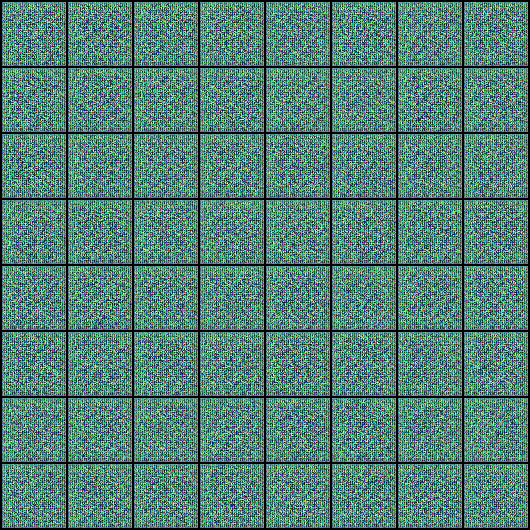

In [117]:
Image('./generated/generated-images-0001.png')

We can visualize the training process by combining the sample images generated after each epoch into a video using OpenCV.

In [118]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

Here's what it looks like:

![]()


We can also visualize how the loss changes over time. Visualizing 
losses is quite useful for debugging the training process. For GANs, we expect the generator's loss to reduce over time, without the discriminator's loss getting too high.



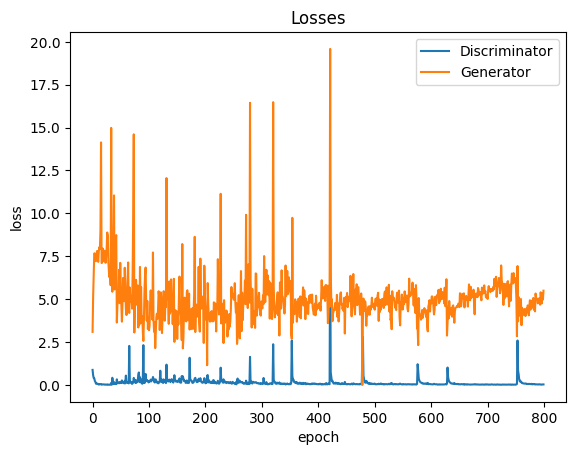

In [119]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

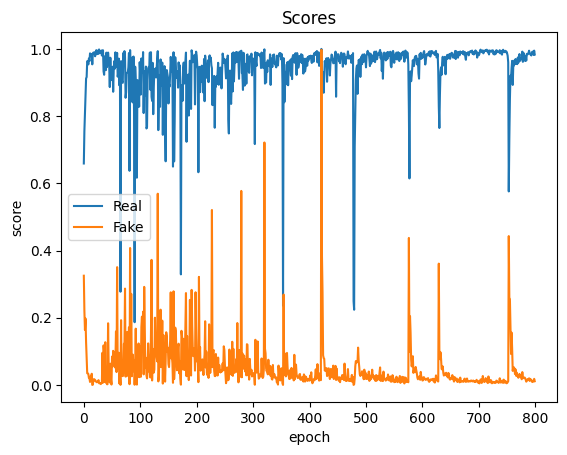

In [120]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');

## Save and Commit

We can upload the full snapshot of this experiment to Jovian:
- Jupyter notebook
- Hyperparameters & metrics
- Models weights
- Training video